In [1]:
%matplotlib inline

import matplotlib.pyplot as plt

from pathlib import Path
import pickle

from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns

import argparse
import os
import pathlib
import random
import glob
import time
import copy
import urllib.request

import torch
from torch import nn, optim
import torchvision
import torchvision.transforms as transforms
from torch.optim import Adam
import torch.utils.data as data
import torchvision.datasets as datasets
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from torch.autograd import Variable
import torch.nn.functional as F
from torchvision import models

# Set Device for CPU or GPU

In [2]:
#Set Device for CUDA or CPU if CUDA not available

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using {device} device")  #EVGA RTX 2080TI

Using cuda device


# Create Data Paths and Quick Analysis

{'CALIFORNIA QUAIL': 161, 'GAMBELS QUAIL': 153, 'HARLEQUIN QUAIL': 134}


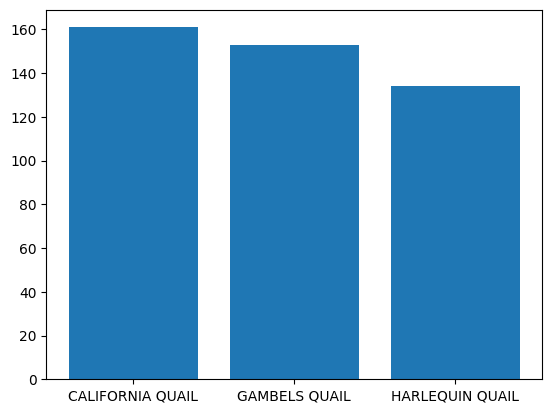

In [3]:
#Creating the data paths for train, valid, test sets

data_path = pathlib.Path('/BirdClassification/train_quail/')

train_path = 'BirdClassification/train_quail/'
test_path = 'BirdClassification/test_quail/'
valid_path = 'BirdClassification/valid_quail/'

#List Classes and numbers for each training image

bird_classes = os.listdir(train_path)

bird_counts = [161,153,134]

bird_dict = dict(zip(bird_classes, bird_counts))

print(bird_dict)

#Plot distribution of training set images

plt.bar(range(len(bird_dict)),list(bird_dict.values()), tick_label=list(bird_dict.keys()))

plt.show()

In [4]:
#Function to view random image from a folder

def view_image(target_dir, target_class):
    
    image_folder = target_dir + target_class
    
    random_image = random.sample(os.listdir(image_folder), 1)
    
    img = plt.imread(image_folder + "/" + random_image[0] )
    plt.imshow(img)
    plt.title(target_class)
    plt.axis("off")

    return img

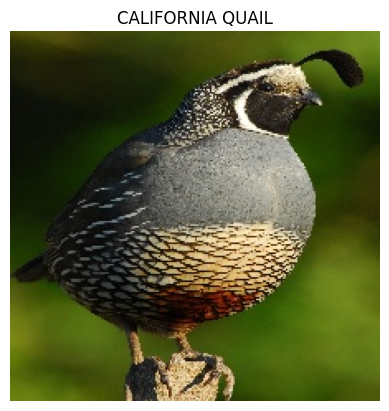

In [5]:
random_image = view_image(train_path, 'CALIFORNIA QUAIL')

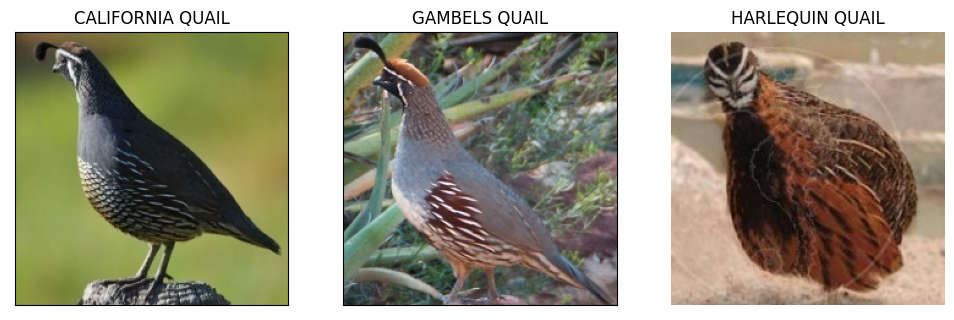

In [6]:
#One of each Quail from the training set

fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (12,12), subplot_kw={'xticks': [],'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(view_image(train_path, bird_classes[i]))
    ax.set_title(bird_classes[i])


# Define Transforms and Loaders

In [7]:
# VGG Models require size of 224x224x3 and conformed weights. Setting them here for a default baselines.

pretrained_size = 224
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.RandomRotation(5),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(pretrained_size, padding=10),
                           transforms.ToTensor(),
                           transforms.Normalize(mean=pretrained_means,
                                                std=pretrained_stds)
                       ])

valid_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.RandomRotation(5),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(pretrained_size, padding=10),
                           transforms.ToTensor(),
                           transforms.Normalize(mean=pretrained_means,
                                                std=pretrained_stds)
                       ])


test_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.ToTensor(),
                           transforms.Normalize(mean=pretrained_means,
                                                std=pretrained_stds)
                       ])

In [8]:
batch_size = 3

#Train Datapath and DataLoader

train_data = datasets.ImageFolder(root = train_path, 
                                 transform = train_transforms)

train_dataloader = data.DataLoader(train_data, batch_size = batch_size, shuffle= True, num_workers=2)

#Test Datapath and DataLoader

test_data = datasets.ImageFolder(root = test_path, 
                                transform = test_transforms)

test_dataloader = data.DataLoader(test_data, batch_size = batch_size, shuffle= True, num_workers=2)

#Validation Datapath and DataLoader

valid_data = datasets.ImageFolder(root = valid_path, 
                                 transform = valid_transforms)

valid_dataloader = data.DataLoader(valid_data, batch_size = batch_size, shuffle= True, num_workers=2)

print(f'Number of training examples: {len(train_data)}')
print(f'Number of validation examples: {len(valid_data)}')
print(f'Number of testing examples: {len(test_data)}')


Number of training examples: 448
Number of validation examples: 15
Number of testing examples: 15


# First Pretrained Model - VGG 11

In [19]:
#First Pretrained Model is the VGG11 (https://pytorch.org/vision/main/models/generated/torchvision.models.vgg11.html)

pretrained = models.vgg11(weights = models.VGG11_Weights.IMAGENET1K_V1)
pretrained

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): ReLU(inplace=True)
    (13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): ReLU(inplace=True)
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

In [20]:
nfeatures = pretrained.classifier[-1].in_features

final_layer = nn.Linear(nfeatures, 3)

print(nfeatures, final_layer)

4096 Linear(in_features=4096, out_features=3, bias=True)


In [21]:
pretrained.classifier[-1] = final_layer

print(pretrained.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=3, bias=True)
)


In [22]:
#Set Parameters

epochs = 10

criterion = nn.CrossEntropyLoss()

#Learning Rate set to 0.0001

optimizer = Adam(pretrained.parameters(), lr=0.0001, weight_decay=0.0001)

exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

#Load to Device

pretrained = pretrained.to(device)
criterion = criterion.to(device)


#Function to calculate accuracy with predictions vs. true labels

def calculate_accuracy(outputs,labels):
    top_pred = outputs.argmax(1, keepdim=True)
    correct = top_pred.eq(labels.view_as(top_pred)).sum()
    acc = correct.float() / labels.shape[0]
    return acc

#Training Function

def train(model, iterator, optimizer, criterion, device):

    epoch_loss = 0.0
    epoch_acc = 0.0

    model.train()

    for inputs,labels in iterator:
        
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)

        loss = criterion(outputs, labels)

        acc = calculate_accuracy(outputs, labels)

        loss.backward()

        optimizer.step()

        epoch_loss += loss.item()
        epoch_acc += acc.item()

    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def validate(model, iterator, criterion, device):
    
    epoch_loss = 0.0
    epoch_acc = 0.0

    model.eval()
    
    for inputs,labels in iterator:
        
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        outputs = model(inputs)
        
        loss = criterion(outputs, labels)

        acc = calculate_accuracy(outputs, labels)

        epoch_loss += loss.item()
        epoch_acc += acc.item()
    
    return epoch_loss / len(iterator), epoch_acc / len(iterator)

#Timing Function to determine how long each epoch takes to train

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs


In [23]:
#Model Variables

pretrained_accuracies = []
pretrained_losses = []
epochs_passed = []
pretrained_valid_accuracies = []
pretrained_valid_losses = []

for epoch in range(epochs+1):

    start = time.monotonic()

    train_loss, train_accuracy = train(pretrained,train_dataloader,optimizer,criterion,device)
    valid_loss, valid_accuracy = validate(pretrained,valid_dataloader,criterion,device)

    end = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start, end)

    epochs_passed.append(epoch)
    pretrained_accuracies.append(train_accuracy)
    pretrained_losses.append(train_loss)
    pretrained_valid_accuracies.append(valid_accuracy)
    pretrained_valid_losses.append(valid_loss)

    print(f'Epoch:{epoch} | Minutes:{epoch_mins} | Seconds: {epoch_secs} | Training Loss: {train_loss} | Training Accuracy: {train_accuracy} | Validation Loss: {valid_loss} | Validation Accuracy {valid_accuracy}')

Epoch:0 | Minutes:0 | Seconds: 9 | Training Loss: 0.44346894217838173 | Training Accuracy: 0.8444444497426351 | Validation Loss: 0.051446322934498315 | Validation Accuracy 0.9333333373069763
Epoch:1 | Minutes:0 | Seconds: 10 | Training Loss: 0.36489446632996725 | Training Accuracy: 0.9133333371082941 | Validation Loss: 0.027684488198866576 | Validation Accuracy 1.0
Epoch:2 | Minutes:0 | Seconds: 10 | Training Loss: 0.23196224557827663 | Training Accuracy: 0.9444444475571314 | Validation Loss: 0.06414520718390122 | Validation Accuracy 0.9333333373069763
Epoch:3 | Minutes:0 | Seconds: 10 | Training Loss: 0.14019704679063635 | Training Accuracy: 0.966666668454806 | Validation Loss: 0.055704453075304625 | Validation Accuracy 1.0
Epoch:4 | Minutes:0 | Seconds: 10 | Training Loss: 0.35238085821859605 | Training Accuracy: 0.9177777818838755 | Validation Loss: 0.33788098851214843 | Validation Accuracy 0.9333333373069763
Epoch:5 | Minutes:0 | Seconds: 10 | Training Loss: 0.2204202210166821 | Tr

<AxesSubplot: xlabel='Epochs', ylabel='Accuracy'>

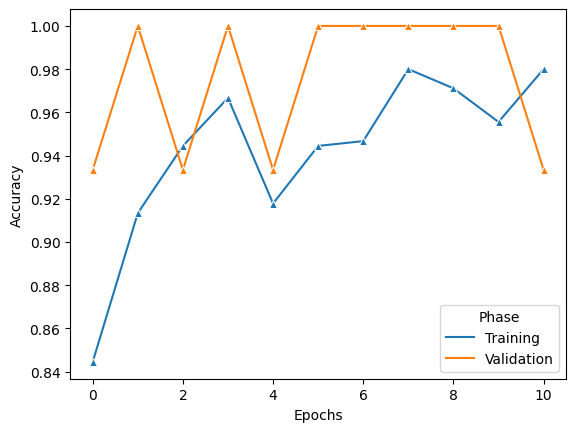

In [24]:
#Send Data from model to dataframe for visualization

train_tuples = list(zip(epochs_passed,pretrained_accuracies,pretrained_losses))
valid_tuples = list(zip(epochs_passed,pretrained_valid_accuracies,pretrained_valid_losses))
df1 = pd.DataFrame(train_tuples, columns = ['Epochs','Accuracy','Loss'])
df1['Phase'] = 'Training'
df2 = pd.DataFrame(valid_tuples, columns = ['Epochs','Accuracy','Loss'])
df2['Phase'] = 'Validation'
df3 = pd.concat([df1,df2])

#Best Model Accuracy
best_vgg11_accuracy = df1['Accuracy'].max()

#Accuracy LinePlot
sns.lineplot(data = df3, x = 'Epochs', y = 'Accuracy', hue = 'Phase', marker='^', markersize = 6, dashes = False)

<AxesSubplot: xlabel='Epochs', ylabel='Loss'>

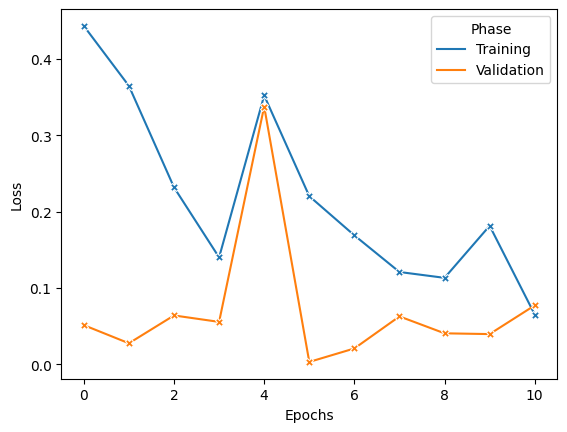

In [25]:
#Loss Line Plot

sns.lineplot(data = df3, x = 'Epochs', y = 'Loss', hue = 'Phase', marker='X', markersize = 6, dashes = False)

# Second VGG Model - VGG16


In [30]:
#VGG16 initialized with weights and given the same treatment as our first model

pretrained2 = models.vgg16(weights = models.VGG16_Weights.IMAGENET1K_V1)

pretrained2

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [31]:
nfeatures = pretrained2.classifier[-1].in_features

final_layer = nn.Linear(nfeatures, 3)

print(nfeatures, final_layer)

4096 Linear(in_features=4096, out_features=3, bias=True)


In [32]:
pretrained2.classifier[-1] = final_layer
print(pretrained2.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=3, bias=True)
)


In [33]:
#Training the VGG16 Model

pretrained2 = pretrained2.to(device)
criterion = criterion.to(device)

pretrained_accuracies = []
pretrained_losses = []
epochs_passed = []
pretrained_valid_accuracies = []
pretrained_valid_losses = []

for epoch in range(epochs+1):

    start = time.monotonic()

    train_loss, train_accuracy = train(pretrained2,train_dataloader,optimizer,criterion,device)
    valid_loss, valid_accuracy = validate(pretrained2,valid_dataloader,criterion,device)

    end = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start, end)

    epochs_passed.append(epoch)
    pretrained_accuracies.append(train_accuracy)
    pretrained_losses.append(train_loss)
    pretrained_valid_accuracies.append(valid_accuracy)
    pretrained_valid_losses.append(valid_loss)

    print(f'Epoch:{epoch} | Minutes:{epoch_mins} | Seconds: {epoch_secs} | Training Loss: {train_loss} | Training Accuracy: {train_accuracy} | Validation Loss: {valid_loss} | Validation Accuracy {valid_accuracy}')

Epoch:0 | Minutes:0 | Seconds: 11 | Training Loss: 1.0981895885864894 | Training Accuracy: 0.4000000091393789 | Validation Loss: 0.9917925000190735 | Validation Accuracy 0.4666666805744171
Epoch:1 | Minutes:0 | Seconds: 12 | Training Loss: 1.0775523535410563 | Training Accuracy: 0.42000001112620033 | Validation Loss: 1.0278727412223816 | Validation Accuracy 0.4666666805744171
Epoch:2 | Minutes:0 | Seconds: 11 | Training Loss: 1.084439863761266 | Training Accuracy: 0.41555556456247966 | Validation Loss: 1.000920021533966 | Validation Accuracy 0.5333333432674408
Epoch:3 | Minutes:0 | Seconds: 12 | Training Loss: 1.1590727239847183 | Training Accuracy: 0.37555556535720824 | Validation Loss: 0.9816150069236755 | Validation Accuracy 0.5333333492279053
Epoch:4 | Minutes:0 | Seconds: 12 | Training Loss: 1.1153749998410543 | Training Accuracy: 0.3755555651585261 | Validation Loss: 0.9417295098304749 | Validation Accuracy 0.5333333492279053
Epoch:5 | Minutes:0 | Seconds: 11 | Training Loss: 1.1

<AxesSubplot: xlabel='Epochs', ylabel='Accuracy'>

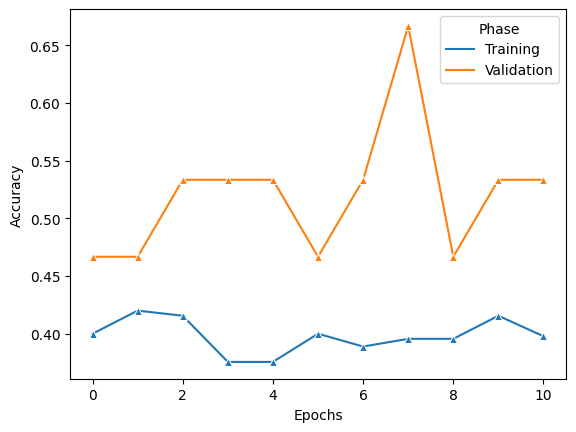

In [36]:
train_tuples = list(zip(epochs_passed,pretrained_accuracies,pretrained_losses))
valid_tuples = list(zip(epochs_passed,pretrained_valid_accuracies,pretrained_valid_losses))
df1 = pd.DataFrame(train_tuples, columns = ['Epochs','Accuracy','Loss'])
best_vgg16_accuracy = df1['Accuracy'].max()
df1['Phase'] = 'Training'
df2 = pd.DataFrame(valid_tuples, columns = ['Epochs','Accuracy','Loss'])
df2['Phase'] = 'Validation'
df3 = pd.concat([df1,df2])


sns.lineplot(data = df3, x = 'Epochs', y = 'Accuracy', hue = 'Phase', marker='^', markersize = 6, dashes = False)

<AxesSubplot: xlabel='Epochs', ylabel='Loss'>

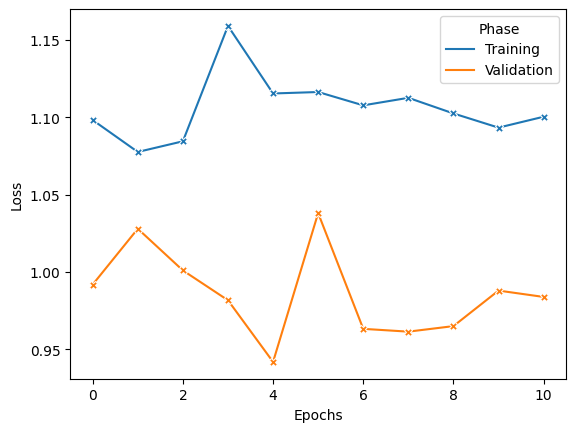

In [37]:
sns.lineplot(data = df3, x = 'Epochs', y = 'Loss', hue = 'Phase', marker='X', markersize = 6, dashes = False)

# Third VGG Model - VGG19



In [38]:
pretrained3 = models.vgg19(weights = models.VGG19_Weights.IMAGENET1K_V1)

pretrained3

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [39]:
nfeatures = pretrained3.classifier[-1].in_features

final_layer = nn.Linear(nfeatures, 3)

print(nfeatures, final_layer)

4096 Linear(in_features=4096, out_features=3, bias=True)


In [40]:
pretrained3.classifier[-1] = final_layer
print(pretrained3.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=3, bias=True)
)


In [41]:
pretrained3 = pretrained3.to(device)
criterion = criterion.to(device)

pretrained_accuracies = []
pretrained_losses = []
epochs_passed = []
pretrained_valid_accuracies = []
pretrained_valid_losses = []

for epoch in range(epochs+1):

    start = time.monotonic()

    train_loss, train_accuracy = train(pretrained3,train_dataloader,optimizer,criterion,device)
    valid_loss, valid_accuracy = validate(pretrained3,valid_dataloader,criterion,device)

    end = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start, end)

    epochs_passed.append(epoch)
    pretrained_accuracies.append(train_accuracy)
    pretrained_losses.append(train_loss)
    pretrained_valid_accuracies.append(valid_accuracy)
    pretrained_valid_losses.append(valid_loss)

    print(f'Epoch:{epoch} | Minutes:{epoch_mins} | Seconds: {epoch_secs} | Training Loss: {train_loss} | Training Accuracy: {train_accuracy} | Validation Loss: {valid_loss} | Validation Accuracy {valid_accuracy}')

Epoch:0 | Minutes:0 | Seconds: 17 | Training Loss: 1.336164158185323 | Training Accuracy: 0.27555556297302247 | Validation Loss: 1.1596765041351318 | Validation Accuracy 0.20000000596046447
Epoch:1 | Minutes:0 | Seconds: 15 | Training Loss: 1.3888298273086548 | Training Accuracy: 0.24888889551162718 | Validation Loss: 1.1954929828643799 | Validation Accuracy 0.26666667461395266
Epoch:2 | Minutes:0 | Seconds: 17 | Training Loss: 1.3705218835671742 | Training Accuracy: 0.25555556257565815 | Validation Loss: 1.1666368246078491 | Validation Accuracy 0.3333333432674408
Epoch:3 | Minutes:0 | Seconds: 18 | Training Loss: 1.3529136415322622 | Training Accuracy: 0.27555556257565816 | Validation Loss: 1.201211428642273 | Validation Accuracy 0.06666666865348816
Epoch:4 | Minutes:0 | Seconds: 25 | Training Loss: 1.3393447188536327 | Training Accuracy: 0.3022222304344177 | Validation Loss: 1.2388585090637207 | Validation Accuracy 0.20000000596046447
Epoch:5 | Minutes:0 | Seconds: 20 | Training Loss

<AxesSubplot: xlabel='Epochs', ylabel='Accuracy'>

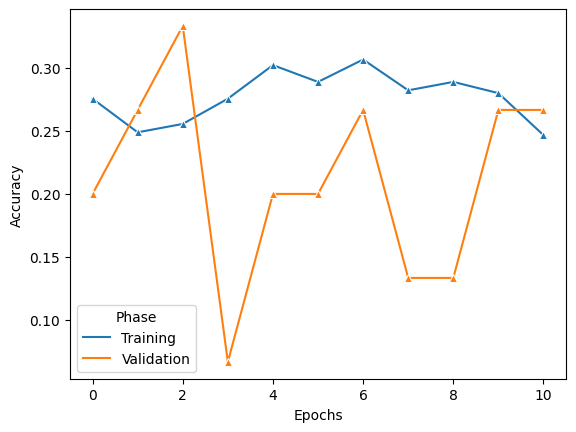

In [46]:
train_tuples = list(zip(epochs_passed,pretrained_accuracies,pretrained_losses))
valid_tuples = list(zip(epochs_passed,pretrained_valid_accuracies,pretrained_valid_losses))
df1 = pd.DataFrame(train_tuples, columns = ['Epochs','Accuracy','Loss'])
df1['Phase'] = 'Training'
df2 = pd.DataFrame(valid_tuples, columns = ['Epochs','Accuracy','Loss'])
df2['Phase'] = 'Validation'
df3 = pd.concat([df1,df2])
best_vgg19_accuracy = df1['Accuracy'].max()

sns.lineplot(data = df3, x = 'Epochs', y = 'Accuracy', hue = 'Phase', marker='^', markersize = 6, dashes = False)

<AxesSubplot: xlabel='Epochs', ylabel='Loss'>

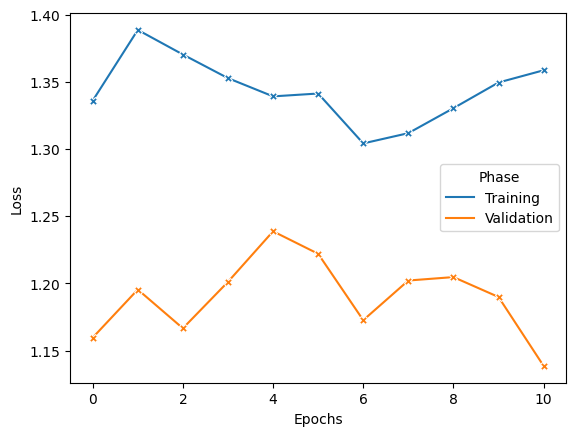

In [47]:
sns.lineplot(data = df3, x = 'Epochs', y = 'Loss', hue = 'Phase', marker='X', markersize = 6, dashes = False)

# Compare Models

In [48]:
print(f'Best VGG11 Accuracy: {best_vgg11_accuracy} | Best VGG11 Accuracy: {best_vgg16_accuracy} | Best VGG19 Accuracy: {best_vgg19_accuracy}')

Best VGG11 Accuracy: 0.9800000011920929 | Best VGG11 Accuracy: 0.42000001112620033 | Best VGG19 Accuracy: 0.30666667461395264


<AxesSubplot: xlabel='Model', ylabel='Score'>

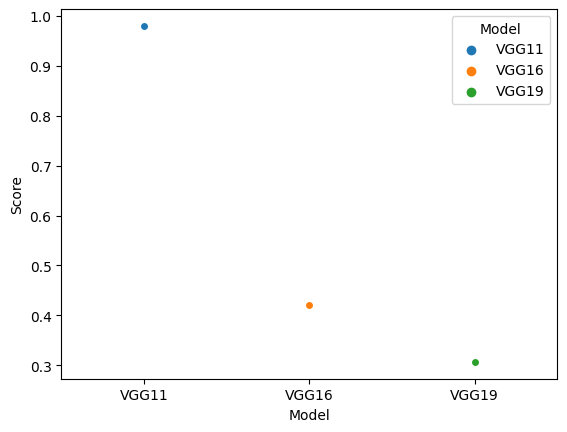

In [49]:
model_list = ['VGG11','VGG16','VGG19']
accuracies = [best_vgg11_accuracy,best_vgg16_accuracy,best_vgg19_accuracy]

overall_model_scores = pd.DataFrame(list(zip(model_list,accuracies)),columns = ['Model','Score'])

sns.stripplot(data = overall_model_scores, x = 'Model',y = 'Score', hue = 'Model')

Prediction: CALIFORNIA QUAIL


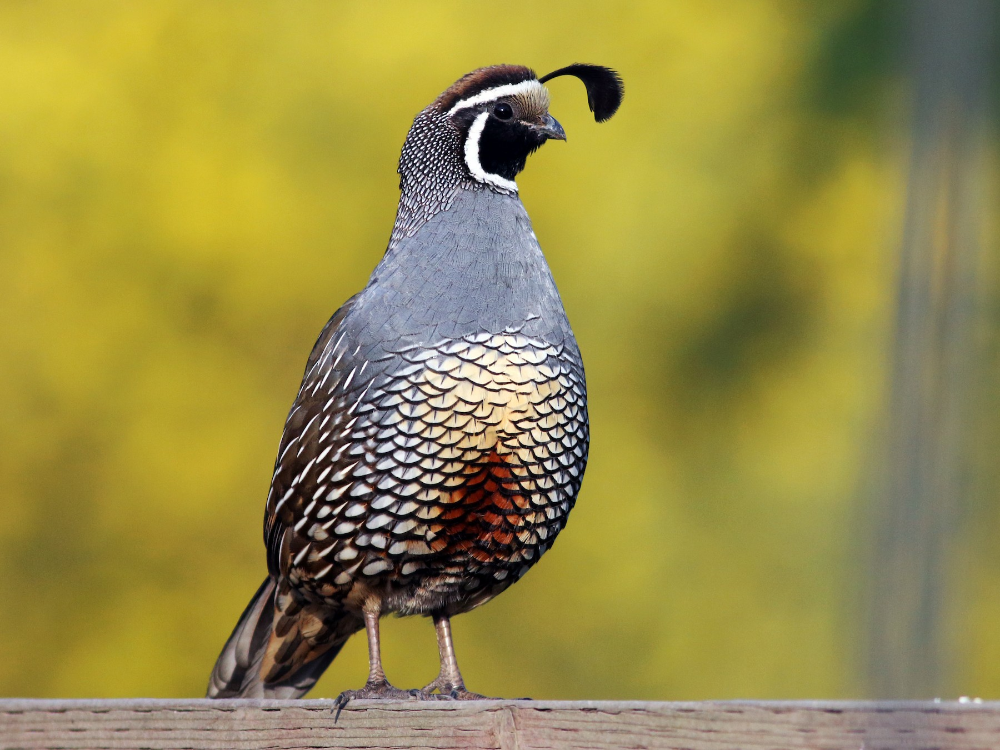

In [50]:
#Function to take random image from file and make prediction

def predict_image(image_path,model):
    
    img = Image.open(image_path)
    
    mean = [0.485, 0.456, 0.406] 
    std = [0.229, 0.224, 0.225]
    
    transform_norm = transforms.Compose([transforms.ToTensor(), 
    transforms.Resize((224,224)),transforms.Normalize(mean, std)])
    # get normalized image
    img_normalized = transform_norm(img).float()
    img_normalized = img_normalized.unsqueeze_(0)
    # input = Variable(image_tensor)
    img_normalized = img_normalized.to(device)
    # print(img_normalized.shape)
    with torch.no_grad():
        model.eval()  
        output = model(img_normalized)
     # print(output)
        index = output.data.cpu().numpy().argmax()
        classes = train_data.classes
        class_name = classes[index]
        return class_name

    

#DataPath for random files downloaded from google


california_quail1 = 'BirdClassification/random_dir/1800.jpg'

gambels_quail1 = 'BirdClassification/random_dir/1900.jpg'

bobwhite1 = 'BirdClassification/random_dir/2000.jpg'

harlequin1 = 'BirdClassification/random_dir/2100.jpg'



#Predict California Quail

print(f'Prediction: {predict_image(california_quail1, pretrained)}')

display(Image.open(california_quail1))


Prediction: GAMBELS QUAIL


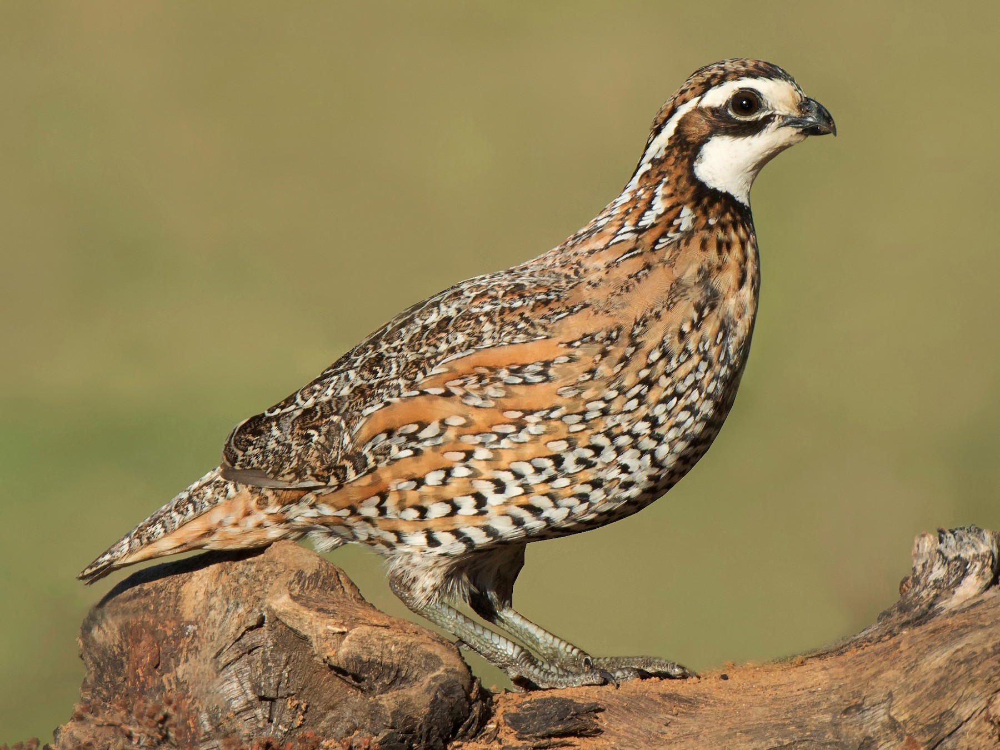

In [51]:
#Test the model on predicting an untrained class

print(f'Prediction: {predict_image(bobwhite1, pretrained)}')

display(Image.open(bobwhite1))


Prediction: GAMBELS QUAIL


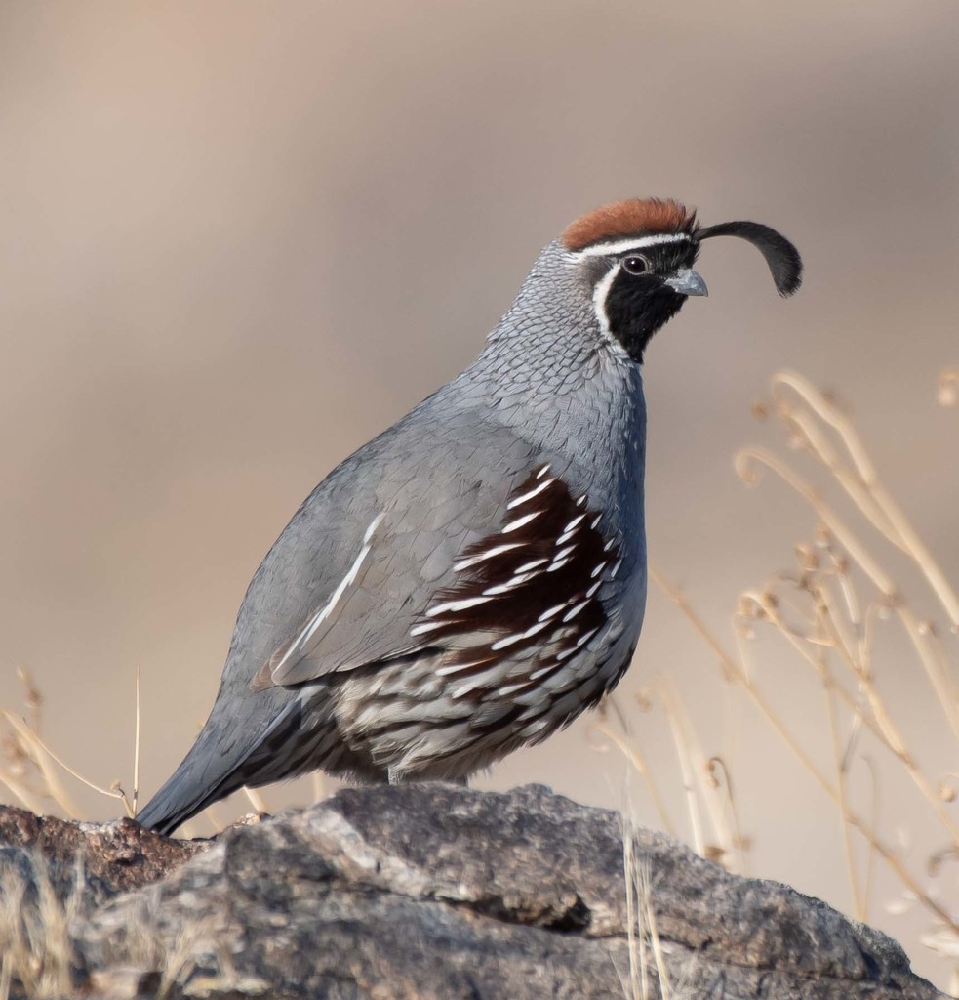

In [52]:
#Gambel's Quail Prediction

print(f'Prediction: {predict_image(gambels_quail1, pretrained)}')

display(Image.open(gambels_quail1))


Prediction: HARLEQUIN QUAIL


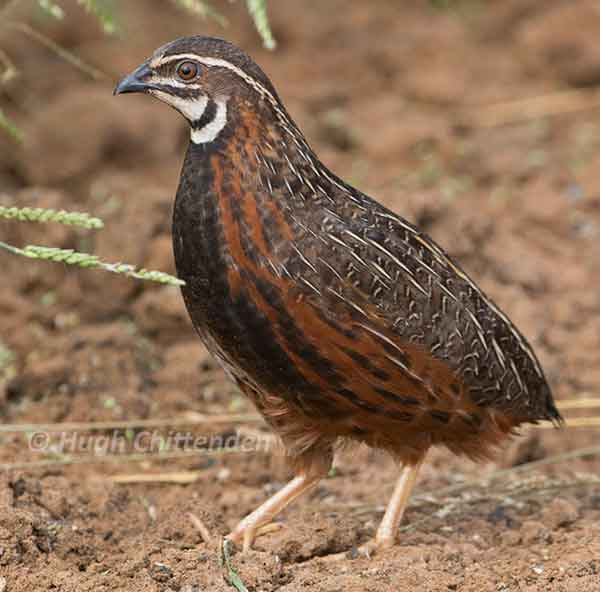

In [53]:
#Harlequin Quail Prediction

print(f'Prediction: {predict_image(harlequin1, pretrained)}')

display(Image.open(harlequin1))